In [1]:
import torch
import torch.nn as nn
import scanpy as sc
import numpy as np

import slalom as sl
import h5py

In [2]:
adata = sc.read('haber_count_pr.h5ad')

In [10]:
select_genes = adata.varm['I'].sum(1)>0
adata._inplace_subset_var(select_genes)
adata.X-=adata.X.mean(0)

In [11]:
class ProxOperGroupL2:
    def __init__(self, alpha, omega, inplace=True):
    # omega - vector of coefficients with size
    # equal to the number of groups
        self._group_vect = omega*alpha
        self._inplace = inplace
    
    def __call__(self, W):        
        if not self._inplace:
            W = W.clone()
        
        norm_vect = W.norm(p=2, dim=0)
        norm_g_gr_vect = norm_vect>self._group_vect
        
        scaled_norm_vector = norm_vect/self._group_vect.view(-1)
        scaled_norm_vector+=(~(scaled_norm_vector>0)).float()
        
        W-=W/scaled_norm_vector
        W*=norm_g_gr_vect.float()
        
        return W

In [12]:
class ProxOperL1:
    def __init__(self, alpha, I, inplace=True):
        self._alpha=alpha
        self._I = ~I.bool()
        self._inplace=inplace
    
    def __call__(self, W):
        if not self._inplace:
            W = W.clone()
        
        W_geq_alpha = W>=self._alpha
        W_leq_neg_alpha = W<=-self._alpha
        
        W-=(W_geq_alpha&self._I).float()*self._alpha
        W+=(W_leq_neg_alpha&self._I).float()*self._alpha
        W-=(~W_geq_alpha&~W_leq_neg_alpha&self._I).float()*W
               
        return W

In [13]:
class AutoencoderLinearDecoder(nn.Module):
    def __init__(self, n_vars, n_terms, **kwargs):
        super().__init__()
        
        self.n_vars = n_vars
        self.n_terms = n_terms
        self.dropout_rate = kwargs.get("dropout_rate", 0.2)
        
        self.encoder = nn.Sequential(
            nn.Linear(self.n_vars, 900),
            nn.BatchNorm1d(900),
            nn.ELU(),
            nn.Dropout(self.dropout_rate),
            nn.Linear(900, 900),
            nn.BatchNorm1d(900),
            nn.ELU(),
            nn.Dropout(self.dropout_rate),
            nn.Linear(900, self.n_terms)
        )
        
        self.decoder = nn.Linear(self.n_terms, self.n_vars, bias=False)
        
        self.decoder.weight.data.normal_()
        self.decoder.weight.data/=self.n_terms**0.5
    
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        
        return encoded, decoded      

In [14]:
def train_autoencoder(adata, autoencoder, l2_reg_alpha, lr, batch_size, num_epochs, prox_operator):
    optimizer = torch.optim.Adam(autoencoder.parameters(), lr=lr)
    #optimizer = torch.optim.SGD(autoencoder.parameters(), lr=lr)
    
    t_X = torch.from_numpy(adata.X)
    n_obs = adata.n_obs
    
    zeros = torch.zeros((batch_size, autoencoder.n_terms))
    
    l2_loss = nn.MSELoss(reduction='sum')
    
    for epoch in range(num_epochs):
        autoencoder.train()
        
        for step in range(int(adata.n_obs/batch_size)):
            X = torch.from_numpy(adata.chunk_X(batch_size))
            
            encoded, decoded = autoencoder(X)
            
            loss = (l2_loss(decoded, X)+l2_reg_alpha*l2_loss(encoded, zeros))/batch_size
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            prox_operator(autoencoder.decoder.weight.data)
            
            if step % 100 == 0: 
                print('Epoch:', epoch, '| batch train loss: %.4f' % loss.data.numpy())
                
        #prox_operator(autoencoder.decoder.weight.data)
        
        autoencoder.eval()
        t_encoded, t_decoded = autoencoder(t_X)
        
        t_reconst = l2_loss(t_decoded, t_X).data.numpy()/n_obs
        t_regul = l2_reg_alpha*l2_loss(t_encoded, torch.zeros_like(t_encoded)).data.numpy()/n_obs
        t_loss = t_reconst + l2_reg_alpha*t_regul
        
        print('Epoch:', epoch, '-- total train loss: %.4f=%.4f+%.4f' % (t_loss, t_reconst, t_regul))
        
        n_deact_terms = (~(autoencoder.decoder.weight.data.norm(p=2, dim=0)>0)).float().sum().numpy()
        print('Number of deactivated terms:', int(n_deact_terms))
        
        n_deact_genes = (~(autoencoder.decoder.weight.data>0)).float().sum().numpy()
        print('Number of deactivated genes:', int(n_deact_genes))

In [15]:
autoencoder = AutoencoderLinearDecoder(adata.n_vars, len(adata.uns['terms']))

In [16]:
LR = 0.001
BATCH_SIZE = 62
N_EPOCHS = 50

ALPHA0 = 0.1

ALPHA1 = 1.05*LR #0.36 #0.4 #0.45 #0.95
ALPHA2 = 0.55*LR #0.78 #0.74 #0.71 #0.55
I = torch.from_numpy(adata.varm['I'])
#OMEGA = I.sum(0).float().sqrt()
OMEGA = torch.ones(len(adata.uns['terms']))

In [17]:
prox_op_l1 = ProxOperL1(ALPHA1, I)
prox_op_group = ProxOperGroupL2(ALPHA2, OMEGA)

prox_operator = lambda W: prox_op_group(prox_op_l1(W))

In [18]:
train_autoencoder(adata, autoencoder, ALPHA0, LR, BATCH_SIZE, N_EPOCHS, prox_operator)

Epoch: 0 | batch train loss: 1542.6860
Epoch: 0 | batch train loss: 344.6233
Epoch: 0 -- total train loss: 339.0934=338.0582+10.3519
Number of deactivated terms: 0
Number of deactivated genes: 1950162
Epoch: 1 | batch train loss: 349.1522
Epoch: 1 | batch train loss: 340.4885
Epoch: 1 -- total train loss: 325.8635=324.8702+9.9323
Number of deactivated terms: 25
Number of deactivated genes: 1952960
Epoch: 2 | batch train loss: 359.9803
Epoch: 2 | batch train loss: 349.2332
Epoch: 2 -- total train loss: 317.6739=316.6125+10.6143
Number of deactivated terms: 80
Number of deactivated genes: 1953479
Epoch: 3 | batch train loss: 359.5173
Epoch: 3 | batch train loss: 322.5400
Epoch: 3 -- total train loss: 311.4123=310.4137+9.9858
Number of deactivated terms: 74
Number of deactivated genes: 1954176
Epoch: 4 | batch train loss: 338.5726
Epoch: 4 | batch train loss: 345.4581
Epoch: 4 -- total train loss: 306.3482=305.3500+9.9821
Number of deactivated terms: 56
Number of deactivated genes: 195397

Epoch: 40 -- total train loss: 261.2732=260.6261+6.4715
Number of deactivated terms: 266
Number of deactivated genes: 1959161
Epoch: 41 | batch train loss: 280.3651
Epoch: 41 | batch train loss: 273.1457
Epoch: 41 -- total train loss: 260.7786=260.1342+6.4440
Number of deactivated terms: 266
Number of deactivated genes: 1959104
Epoch: 42 | batch train loss: 255.0168
Epoch: 42 | batch train loss: 275.8803
Epoch: 42 -- total train loss: 261.0535=260.4315+6.2193
Number of deactivated terms: 266
Number of deactivated genes: 1959326
Epoch: 43 | batch train loss: 288.4845
Epoch: 43 | batch train loss: 258.4642
Epoch: 43 -- total train loss: 260.9556=260.3301+6.2550
Number of deactivated terms: 266
Number of deactivated genes: 1959461
Epoch: 44 | batch train loss: 278.3873
Epoch: 44 | batch train loss: 268.8338
Epoch: 44 -- total train loss: 260.8208=260.1782+6.4256
Number of deactivated terms: 266
Number of deactivated genes: 1959423
Epoch: 45 | batch train loss: 265.7347
Epoch: 45 | batch t

In [19]:
autoencoder.decoder.weight.data.norm(p=2, dim=0)

tensor([0.0000, 2.2726, 0.0000, 0.0000, 1.3064, 0.0000, 1.2577, 0.0000, 1.2169,
        0.0000, 0.0000, 0.0000, 1.1494, 1.2522, 1.0253, 1.1501, 1.1098, 1.2794,
        0.0000, 1.2569, 1.2374, 1.5769, 1.2596, 0.0000, 0.0000, 2.7299, 0.0000,
        1.3488, 0.0000, 0.0000, 1.5912, 1.2603, 1.3604, 0.0000, 0.0000, 0.0000,
        1.6058, 0.0000, 1.2982, 0.0000, 0.0000, 1.5726, 1.2289, 0.0000, 2.3220,
        1.2728, 0.0000, 1.3227, 1.1195, 1.1481, 1.1446, 0.0000, 0.0000, 0.0000,
        1.2215, 1.4265, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 1.2565, 0.0000,
        0.0000, 0.0000, 1.3359, 0.0000, 0.0000, 1.3127, 1.2440, 0.0000, 0.0000,
        0.0000, 0.0000, 1.3547, 1.2289, 0.0000, 0.0000, 0.0000, 1.1222, 1.2652,
        0.0000, 0.0000, 0.0000, 1.2778, 0.0000, 1.1653, 1.2993, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 1.3395, 0.0000, 0.0000, 1.3667, 0.0000, 0.0000,
        0.0000, 1.3847, 1.4587, 0.0000, 0.0000, 1.2554, 0.0000, 0.0000, 0.0000,
        0.0000, 0.0000, 0.0000, 0.0000, 

In [20]:
rel = autoencoder.decoder.weight.data.norm(p=2, dim=0).data.numpy()
idx = np.argsort(-rel)
adata.uns['terms'][idx][:70]

array(['TCA_CYCLE_AND_RESPIRATORY_ELEC', 'METABOLISM_OF_PROTEINS',
       'CELL_CYCLE', 'TRANSLATION', 'IMMUNE_SYSTEM',
       'METABOLISM_OF_LIPIDS_AND_LIPOP', 'METABOLISM_OF_RNA',
       'RESPIRATORY_ELECTRON_TRANSPORT', 'BIOLOGICAL_OXIDATIONS',
       'METABOLISM_OF_CARBOHYDRATES', 'ASTROCYTES',
       'TRANSMEMBRANE_TRANSPORT_OF_SMA', 'HEMOSTASIS',
       'METABOLISM_OF_AMINO_ACIDS_AND_', 'INFLUENZA_VIRAL_RNA_TRANSCRIPT',
       'CELL_CYCLE_MITOTIC', 'METABOLISM_OF_NUCLEOTIDES', 'MRNA_SPLICING',
       'MRNA_PROCESSING', 'INFLUENZA_LIFE_CYCLE', 'MEMBRANE_TRAFFICKING',
       'CYTOKINE_SIGNALING_IN_IMMUNE_S', 'CELL_CELL_COMMUNICATION',
       'INTEGRATION_OF_ENERGY_METABOLI', 'DEVELOPMENTAL_BIOLOGY',
       'GLUCOSE_METABOLISM', 'METABOLISM_OF_VITAMINS_AND_COF',
       'HIV_INFECTION', 'APOPTOSIS', 'NONSENSE_MEDIATED_DECAY_ENHANC',
       'DIABETES_PATHWAYS', 'POST_TRANSLATIONAL_PROTEIN_MOD',
       'TRNA_AMINOACYLATION', 'AXON_GUIDANCE', 'PROTEIN_FOLDING',
       'FATTY_ACID_TRIACY

In [21]:
def select_terms(first, second):
    f = np.where(adata.uns['terms']==first)[0][0]
    s = np.where(adata.uns['terms']==second)[0][0]
    return f, s

In [29]:
terms = select_terms('MHC_CLASS_II_ANTIGEN_PRESENTAT', 'TCA_CYCLE_AND_RESPIRATORY_ELEC')

In [30]:
W = autoencoder.decoder.weight.data.numpy()
(np.abs(W[:, terms])>0).sum(0)

array([ 74, 128])

In [31]:
autoencoder.decoder.weight.data.norm(p=2, dim=0)[list(terms)]

tensor([1.3454, 2.7299])

In [32]:
adata.varm['I'][:, terms].sum(0)

array([ 71, 110])

In [33]:
encoded, decoded = autoencoder(torch.from_numpy(adata.X))
vars_latent = encoded[:, terms].data.numpy()

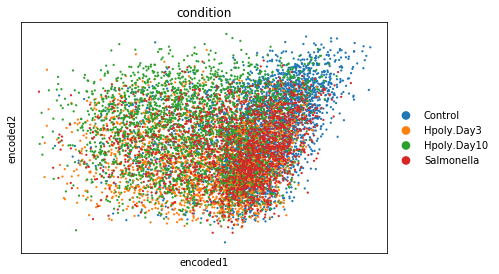

In [34]:
adata.obsm['X_encoded'] = vars_latent
sc.pl.scatter(adata, basis='encoded', color='condition', size=20)

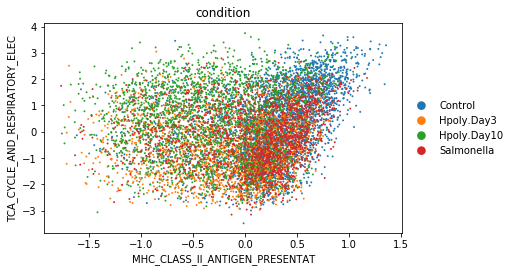

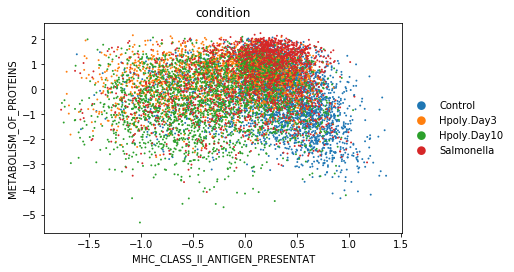

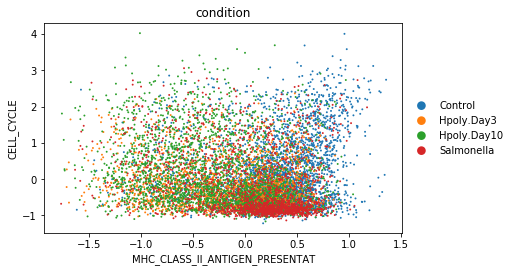

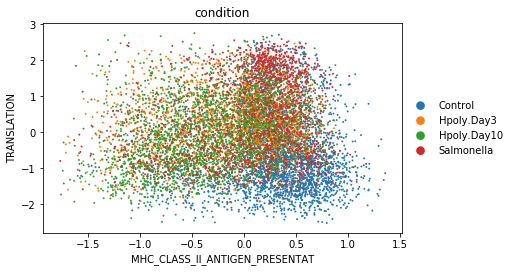

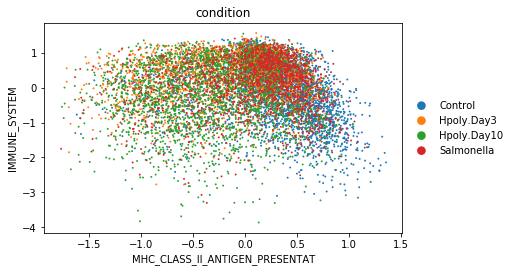

...

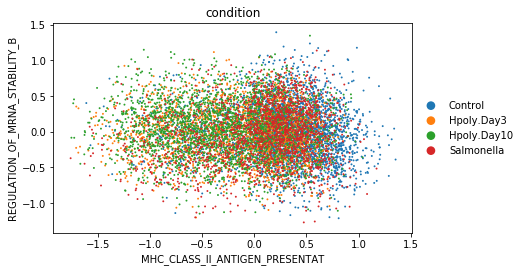

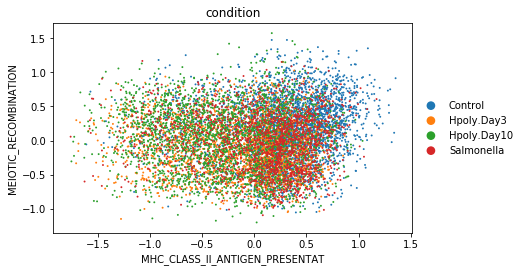

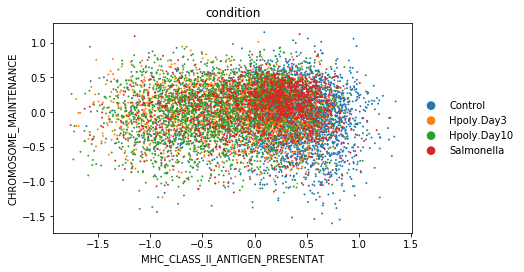

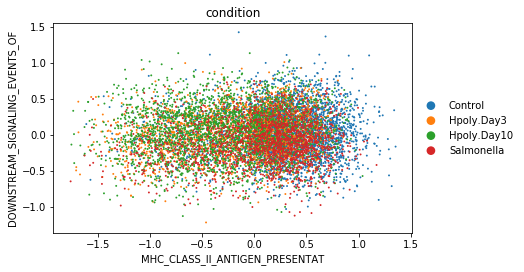

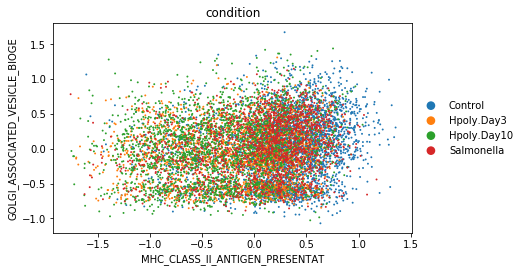

In [36]:
for t in adata.uns['terms'][idx][:100]:
    terms = select_terms(t, 'MHC_CLASS_II_ANTIGEN_PRESENTAT')
    vars_latent = encoded[:, terms].data.numpy()
    adata.obs[t] = vars_latent[:, 0]
    adata.obs['MHC_CLASS_II_ANTIGEN_PRESENTAT'] = vars_latent[:, 1]
    sc.pl.scatter(adata, x='MHC_CLASS_II_ANTIGEN_PRESENTAT', y=t, color='condition', size=15)